### This notebook walks through how to work with ocean observations provided in netcdf format from ocean profiling floats. Specifically this focuses on working with data from Temple's very own __"Hooter the Owl"__ float roaming the upper 2000 m of the Indian Ocean collection __physical and biogeochemical data__ as part of the Southern Ocean Carbon and Climate Observations and Modeling (SOCCOM) observing system. SOCCOM floats, specifically deployed in the Southern Ocean, augment the international __Argo__ float array by adding biogeochemical observational capabilities and under-ice avoidance software.

#### Authors: Dr. Rebecca L. Beadling. For any questions regarding the contents of this notebook please contact rebecca.beadling@temple.edu.

#### SOCCOM is a multi-institutional program focused on unlocking the mysteries of the Southern Ocean and determining its influence on climate. Housed at Princeton University, [SOCCOM](https://soccom.princeton.edu/) is supported by the National Science Foundation under NSF Award PLR-1425989 and OPP-1936222. 

#### Watch the animation [__here__](https://soccom.princeton.edu/sites/g/files/toruqf5341/files/styles/1x1_750w_750h/public/2023-07/A%20SOCCOM%20profiling%20float%20thumbnail.png?h=77ec2104&itok=IjdaxBMp) to learn more about the SOCCOM scientific vision and array of floats.

![](https://soccom.princeton.edu/sites/g/files/toruqf5341/files/SOCCOM_horiz_logo_2.png)

### The diagram below summarizes the life cycle of a typical Argo float, from ship-based float deployment to transmission of collected data to orbiting satellites above. Please watch the following video for more details on the [Day in the Life of a SOCCOM float](https://www.youtube.com/watch?v=V5_pCmUM2Qc). 


![](https://argo.ucsd.edu/wp-content/uploads/sites/361/2020/06/float_cycle_1.png)
https://argo.ucsd.edu/how-do-floats-work/

### Ocean profiling floats were developed in the early 1990s as a result of the international World Ocean Circulation Experiment (WOCE) which set out to collect an unprecedented number of ocean observations from 1988 to 1998. This resulted in a significant advance in our understanding of ocean physical and biogeochemical properties and circulation. One of the major results was an [__Atlas__](http://woceatlas.ucsd.edu/) of data on "the state of the ocean". 

![](http://woceatlas.tamu.edu/images/BANNER4web.jpg)
![](http://sam.ucsd.edu/whp_atlas/pacific/images/pacific5_r1_c1.jpg)
![](http://whp-atlas.ucsd.edu/whp_atlas/atlantic/images/atlantic_r1_c1.jpg)
![](http://sam.ucsd.edu/whp_atlas/indian/images/indian_r1_c1.jpg)

### Early floats, named the Autonomous Lagrangian Circulation Explorer (ALACE) ([Davis et al., 1992](https://journals.ametsoc.org/view/journals/atot/9/3/1520-0426_1992_009_0264_talce_2_0_co_2.xml)) were developed to track information on ocean currents and later advanced to also collect data on the temperature and salinity of the waters around them as they rose through the water column ([Davis et al 2001](https://journals.ametsoc.org/view/journals/atot/18/6/1520-0426_2001_018_0982_paaoai_2_0_co_2.xml)). It was soon recognized that these profiling floats could be used to monitor temperature and salinity in the upper 2000 m of the global oceans and plans for a global array of profiling floats were proposed, known as [__Argo__](https://argo.ucsd.edu/).

### The map below shows the position and total number of Argo floats currently in the water around the globe, with a __total of 3,818 active floats__!



![](https://sio-argo.ucsd.edu/statusbig.gif)

### Traditional Argo floats collect __Temperature__, __Conductivity (Salinity)__, and __Pressure__ profiles via an on-board CTD sensor. In addition to a CTD sensor, SOCCOM floats are equipped with biogeochemical sensors with the goal of producing a climate-quality data record for __carbon cycling__. 


#### Argo:
* ##### Temperature
* ##### Salinity
* ##### Pressure

#### SOCCOM:
* ##### Temperature
* ##### Salinity
* ##### Pressure
* ##### Oxygen
* ##### Nitrate
* ##### pH


![](https://soccom.princeton.edu/sites/g/files/toruqf5341/files/styles/1x1_750w_750h/public/2023-07/A%20SOCCOM%20profiling%20float%20thumbnail.png?h=77ec2104&itok=IjdaxBMp)_

### In August 2023, SOCCOM float __Hooter the Owl__ (pictured below) was deployed into the Indian Ocean from the Roger Revelle Research Vessell. In this notebook, we will analyze the data collected thus far to investigate the properties of the ocean Hooter has traversed through thus far.

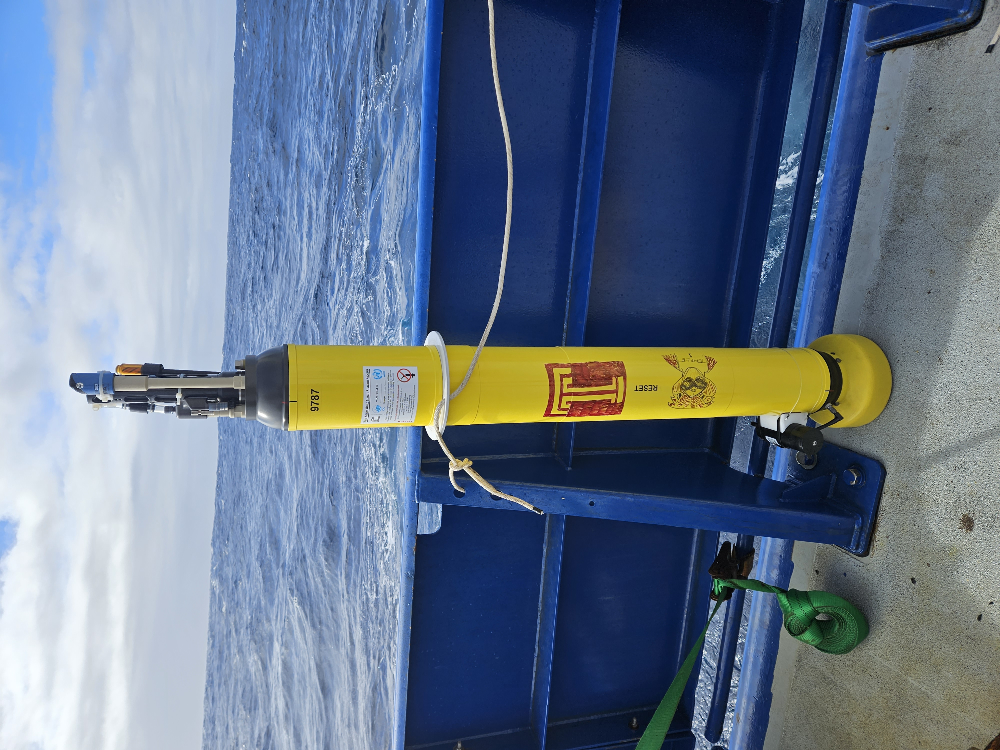

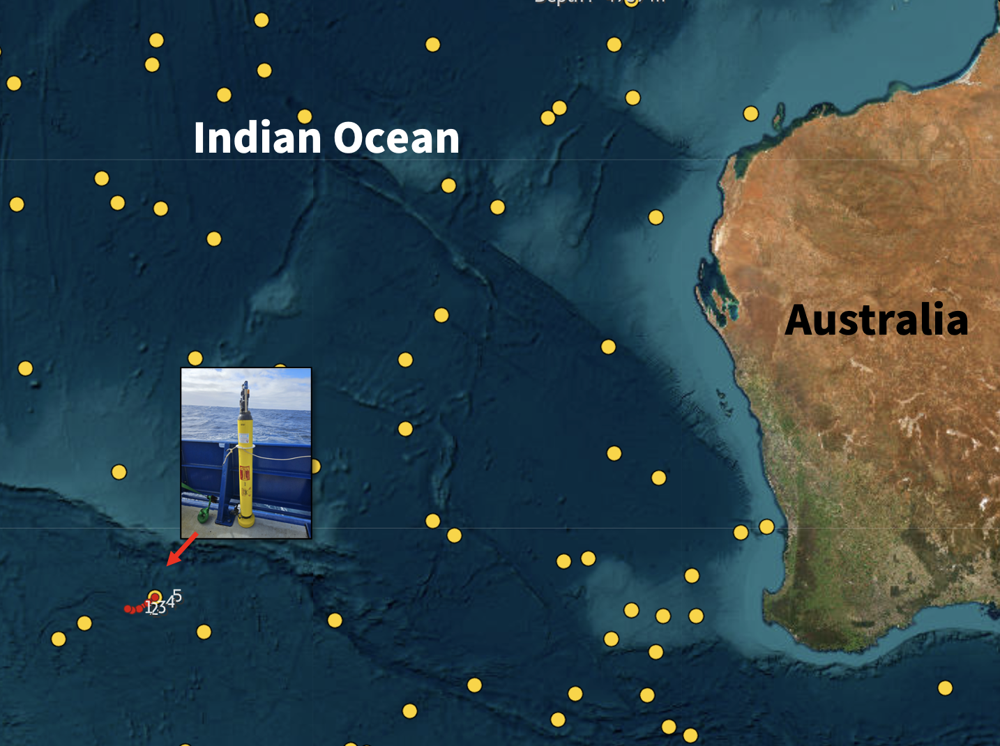

## Read in the data

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cmocean

In [2]:
xr.set_options(display_style='html')
%matplotlib inline                           
%config InlineBackend.figure_format='retina' 
plt.rcParams['figure.figsize'] = 12,6 
plt.style.use("dark_background") ### sets dark background for all plots

In [3]:
ees_climate_dir = 'C:/Users/TU_Climate24_Student/Desktop/ees_climate/'
hooter_data = xr.open_dataset(ees_climate_dir+'unit4/data/soccom/GL_PR_PF_5907051.nc')

In [4]:
hooter_data

<xarray.Dataset>
Dimensions:                   (TIME: 18, LATITUDE: 18, LONGITUDE: 18,
                               POSITION: 18, DEPTH: 495)
Coordinates:
  * TIME                      (TIME) datetime64[ns] 2023-08-06T01:16:05 ... 2...
  * LATITUDE                  (LATITUDE) float32 -34.0 -34.0 ... -33.28 -33.28
  * LONGITUDE                 (LONGITUDE) float32 95.57 95.57 ... 96.16 96.16
Dimensions without coordinates: POSITION, DEPTH
Data variables: (12/32)
    TIME_QC                   (TIME) float32 ...
    POSITION_QC               (POSITION) float32 ...
    DC_REFERENCE              (TIME) object ...
    DIRECTION                 (TIME) object ...
    VERTICAL_SAMPLING_SCHEME  (TIME) object ...
    PRES                      (TIME, DEPTH) float32 ...
    ...                        ...
    CPHL_ADJUSTED_QC          (TIME, DEPTH) float32 ...
    CPHL_ADJUSTED_ERROR       (TIME, DEPTH) float64 ...
    NTAW                      (TIME, DEPTH) float64 ...
    NTAW_QC                   (TIME, DEPTH) float32 ...
    PHPH                      (TIME, DEPTH) float64 ...
    PHPH_QC                   (TIME, DEPTH) float32 ...
Attributes: (12/49)
    data_type:                      OceanSITES vertical profile
    format_version:                 1.4
    platform_code:                  5907051
    institution:                    University of Washington (Seattle)
    institution_edmo_code:          3839
    site_code:                       
    ...                             ...
    last_date_observation:          2023-10-27T00:48:21Z
    last_latitude_observation:      -33.27710
    last_longitude_observation:     96.16200
    date_update:                    2023-10-29T03:11:31Z
    history:                        2023-10-29T03:11:31Z : Creation
    data_mode:                      M

### In the excercises below we are interested in the following variables contained within our Dataset:

* #### TEMP: measured ocean temperature (units: Celcius )
* #### PSAL: measured ocean salinity (units: practical salinity units, 0.001)

### Extract the DataArrays we need and do some renaming of dimensions & assignment of coordinates necessary to produce plots of pressure vs. property.

In [5]:
hooter_temp = hooter_data.TEMP.rename({'DEPTH':'PRESSURE'}).assign_coords({'PRESSURE':hooter_data.PRES[0].values})
hooter_salinity = hooter_data.PSAL.rename({'DEPTH':'PRESSURE'}).assign_coords({'PRESSURE':hooter_data.PRES[0].values})

### We see after investigating the `hooter_temp` DataArray, that our dimensions are `PRESSURE` and `TIME`

In [6]:
hooter_temp

<xarray.DataArray 'TEMP' (TIME: 18, PRESSURE: 495)>
[8910 values with dtype=float64]
Coordinates:
  * TIME      (TIME) datetime64[ns] 2023-08-06T01:16:05 ... 2023-10-27T00:48:21
  * PRESSURE  (PRESSURE) float32 2.4 3.9 6.0 8.0 ... 1.299e+03 1.4e+03 1.499e+03
Attributes:
    standard_name:        sea_water_temperature
    long_name:            Sea temperature
    units:                degrees_C
    data_mode:            R
    ancillary_variables:  TEMP_QC

### Make quick and simple plot

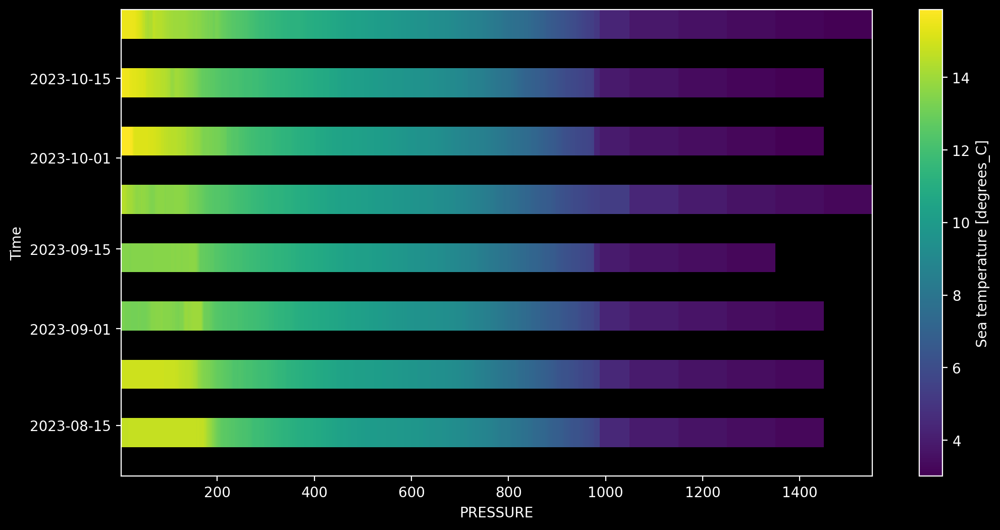

In [7]:
hooter_temp.plot()

### We see the plot above is not ideal: we want `time` on the x-axis and `pressure` on our y-axis:

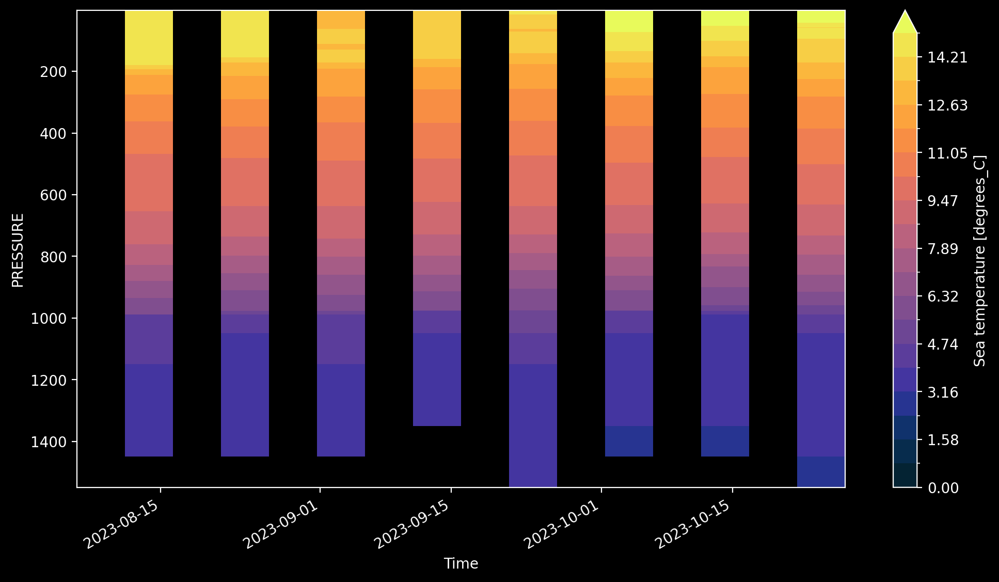

In [8]:
hooter_temp.plot(x='TIME',                  ### Specificy that we want Time as our x-axis
                 y='PRESSURE',              ### Specify we want Depth as our y-axis
                 yincrease=False,           ### Sets up the plot so surface is at the top
                 cmap=cmocean.cm.thermal,   ### Specify colormap
                 vmin=0, vmax=15,           ### Specify vmin & vmax
                 levels=20)                 ### Specify number of levels so we can better see details

### <span style="color:red"> In the cells below, work through 1) making a simple plot of salinity observations and based off the vmin and vmax values that plot by default, 2) customize the plot to one where you can clearly see the details of salinity change over depth and time, similar to the plot above that we made for temperature.
    
### Find a colormap that displays the data well:
https://matplotlib.org/stable/gallery/color/named_colors.html
https://matplotlib.org/cmocean/


### Let's now create a plot of the first profile collected vs. the last:

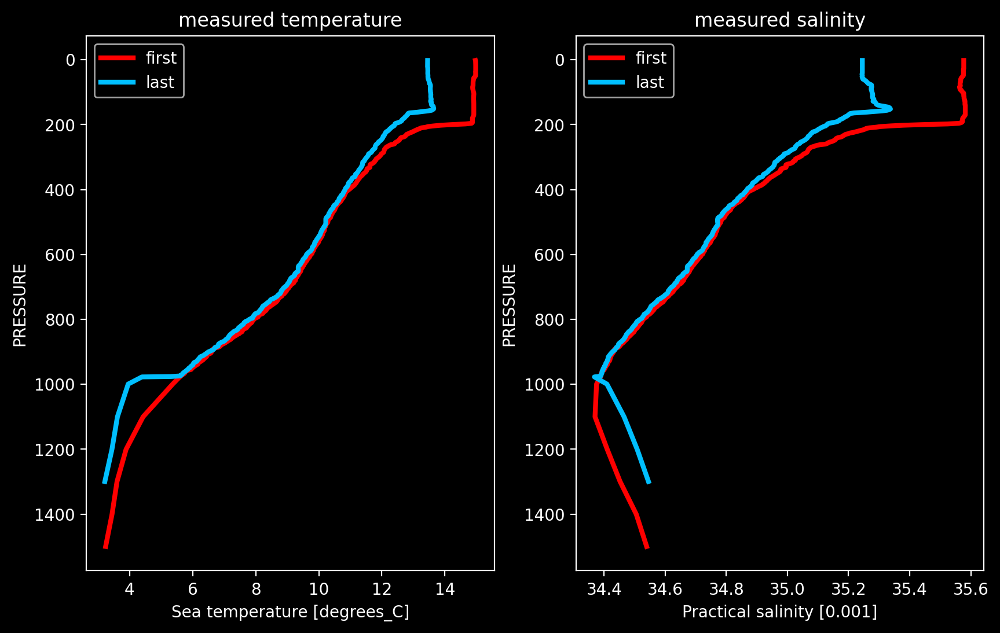

In [9]:
### Create a figure with 2 subplots spanning 2 columns and 1 row:
fig, (ax0, ax1) = plt.subplots(ncols=2,nrows=1,figsize=(10,6))

### Plot the temperature data on ax0:
hooter_temp.isel(TIME=0).plot(ax=ax0,y='PRESSURE',
                              yincrease=False,
                              label='first', color='red',linewidth=3)
hooter_temp.isel(TIME=8).plot(ax=ax0,y='PRESSURE',
                              yincrease=False,
                              label='last',
                              color='deepskyblue',linewidth=3)

### Plot the salinity data on ax1:
hooter_salinity.isel(TIME=0).plot(ax=ax1,y='PRESSURE',
                              yincrease=False,
                              label='first', color='red',linewidth=3)
hooter_salinity.isel(TIME=8).plot(ax=ax1,y='PRESSURE',
                              yincrease=False,
                              label='last',
                              color='deepskyblue',linewidth=3)

ax0.set_title('measured temperature')
ax1.set_title('measured salinity')

ax0.legend()
ax1.legend()

### <span style="color:red"> Look at your plots in detail and describe:
    1) On average .... how do salinity and temperature values change as a function of depth? Why is this the case?
    3) What are some interesting features you observe in how they change?
    2) What do you notice that is different about how temperature and salinity changes with depth? (hint ... look at what's happening at 1000 m)
    3) Over the time that the float as been collecting data, describe how temperature and salinity in the upper ~ 400 m (< 400 dbar pressure) has evolved.

### <span style="color:red"> Based on the following maps of ocean gyre circulation and the location of the float (__red dot__ in second figure), _theoretically_, which ocean currents would Hooter likely encounter over the next 5 years? (This is a very over-simplified map of ocean gyre circulation ... "west wind drift" is the Antarctic Circumpolar Current (ACC).

![](https://oceanservice.noaa.gov/facts/gyre.jpg)

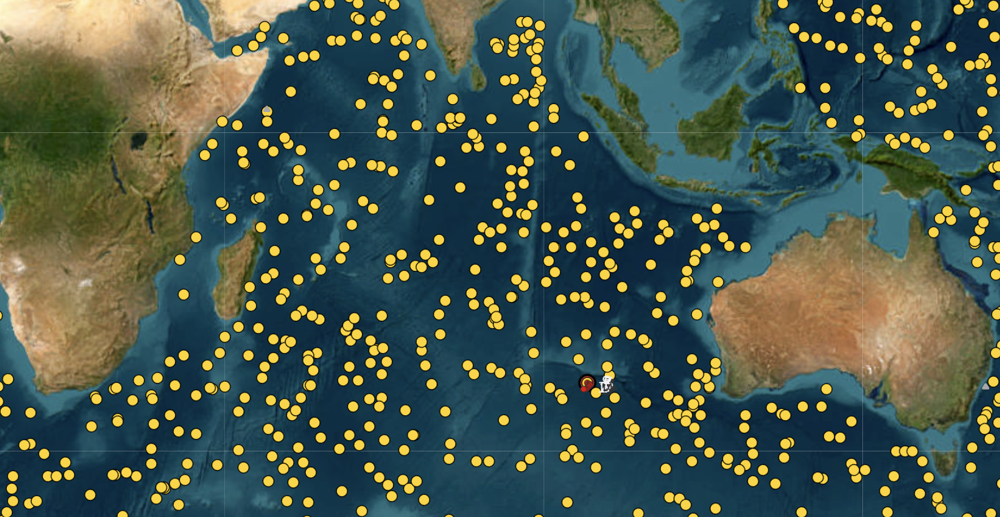

### The goal of this notebook was to introduce you to some of the raw observations that are used to construct basin and global-scale maps of ocean properties and their changes over time. Profiles of ocean properties from floats in addition to observations from ship-based measurements and instrumented arrays (even seals with instruments attached to them!) are used to produce gridded mapped products. One of which is the [World Ocean Atlas (WOA)](https://www.ncei.noaa.gov/products/world-ocean-atlas), which is used widley across the climate observation and modeling community. We will explore WOA to look at cross-sections of properties in the next notebook.

![](https://earimediaprodweb.azurewebsites.net/Api/v1/Multimedia/20495b57-3d0d-45b9-9f9d-fbe1cd89b593/Rendition/low-res/Content/Public)
![](https://th-thumbnailer.cdn-si-edu.com/MfegEyVq7bR25p__iSWhmFGyzBg=/1000x750/filters:no_upscale()/https://tf-cmsv2-smithsonianmag-media.s3.amazonaws.com/filer/b9/d9/b9d9e780-29b7-4c92-aa06-3f0e11d4f256/weddellcrop.jpg)

Read more here: https://www.smithsonianmag.com/science-nature/how-data-gathering-seals-help-scientists-measure-melting-antarctic-180969615/

### <span style="color:red"> After working through the excercises in red above, push your finished notebook to GitHub.